In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
!nvidia-smi

Tue Sep 17 17:51:56 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   53C    P8              10W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [3]:
!pip install --quiet pytorch-lightning

In [4]:
!pip install tqdm

In [5]:
import seaborn as sns
from pylab import rcParams

import matplotlib.pyplot as plt
from matplotlib import rc
import math
import matplotlib

import pandas as pd
import numpy as np

import pytorch_lightning as pl
from pytorch_lightning.callbacks import ModelCheckpoint, EarlyStopping
from pytorch_lightning.loggers import TensorBoardLogger
from sklearn.preprocessing import StandardScaler

import torch
import torch.autograd as autograd
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

from torch.utils.data import Dataset, DataLoader
from collections import defaultdict
from datetime import datetime

In [6]:
%matplotlib inline
%config InlineBackend.figure_format='retina'

sns.set(style='whitegrid', palette='muted', font_scale=1.2)

HAPPY_COLORS_PALETTE = ["#01BEFE", "#FFDD00", "#FF7D00", "#FF006D", "#ADFF02", "#8F00FF"]

sns.set_palette(sns.color_palette(HAPPY_COLORS_PALETTE))

rcParams['figure.figsize'] = 12, 8

In [7]:
pl.seed_everything(42)

INFO:lightning_fabric.utilities.seed:Seed set to 42


42

# Data Preparation

In [8]:
df = pd.read_csv(r'/content/drive/MyDrive/Random Colabs/BTC-Hourly.csv')
df["date"] = pd.to_datetime(df["date"], utc=True)
df.drop(["unix", "symbol", "Volume USD"], axis=1, inplace=True)
df.sort_values(by="date", inplace=True)

df.set_index("date", inplace=True)
df

,open,high,low,close,Volume BTC
date,,,,,
2018-05-15 06:00:00+00:00,8733.86,8796.68,8707.28,8740.99,4.906603e+06
2018-05-15 07:00:00+00:00,8740.99,8766.00,8721.11,8739.00,2.390399e+06
2018-05-15 08:00:00+00:00,8739.00,8750.27,8660.53,8728.49,7.986063e+06
2018-05-15 09:00:00+00:00,8728.49,8754.40,8701.35,8708.32,1.593992e+06
2018-05-15 10:00:00+00:00,8708.32,8865.00,8695.11,8795.90,1.110127e+07
...,...,...,...,...,...
2022-02-28 20:00:00+00:00,41361.99,41971.00,41284.11,41914.97,2.471517e+02
2022-02-28 21:00:00+00:00,41917.09,41917.09,41542.60,41659.53,6.975168e+01
2022-02-28 22:00:00+00:00,41657.23,44256.08,41650.29,42907.32,5.275406e+02


In [9]:
scaler = StandardScaler()

# Fit the scaler to your data and transform it
scaled_data = pd.DataFrame(scaler.fit_transform(df), columns=df.columns)
scaled_data.index = df.index

In [10]:
split_date = pd.to_datetime('2021-01-01', utc=True)
train_df = scaled_data.loc[:split_date]
test_df = scaled_data.loc[split_date:]

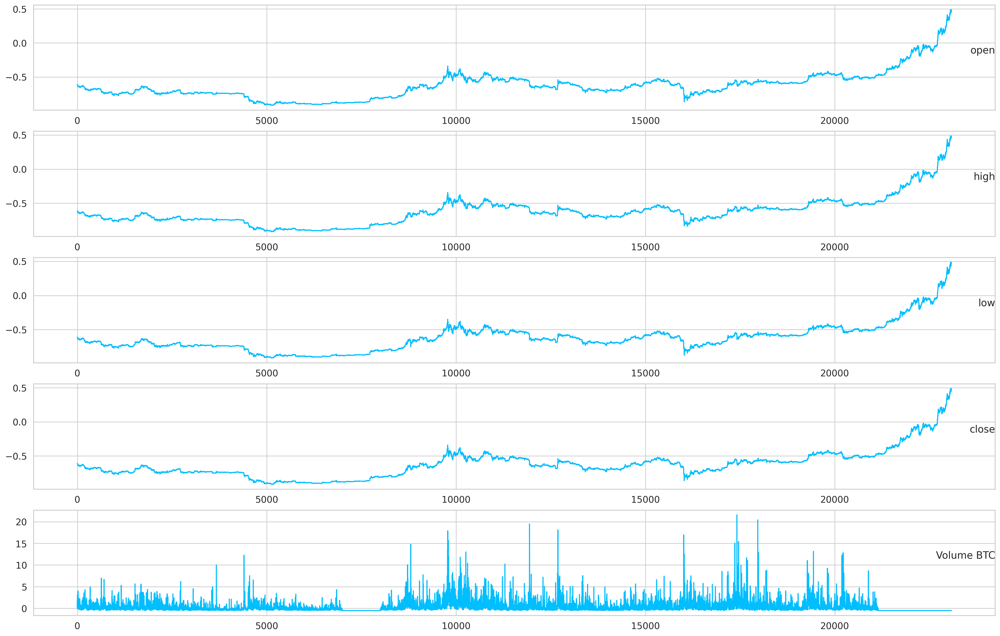

In [11]:
values = train_df.values

# specify columns to plot
groups = [0, 1, 2, 3, 4]
i = 1

# plot each column
plt.figure(figsize=(25, 16))
for group in groups:
    plt.subplot(len(groups), 1, i)
    plt.plot(values[:, group])
    plt.title(df.columns[group], y=0.5, loc='right')
    i += 1
plt.show()

# Preparig Data

In [12]:
SEQUENCE_LENGHT = 24*4

In [13]:
def create_sequences(input_data: pd.DataFrame, target_column, sequence_length):
    sequences = []
    data_size = len(input_data)

    for i in range(data_size - sequence_length):
        sequence = input_data[i:i + sequence_length]
        label_position = i + sequence_length
        label = input_data.iloc[label_position][target_column]
        sequences.append((sequence, label))

    return sequences

In [14]:
train_sample_sequences = create_sequences(train_df, "high", sequence_length=SEQUENCE_LENGHT)
test_sample_sequences = create_sequences(test_df, "high", sequence_length=SEQUENCE_LENGHT)

In [15]:
len(train_sample_sequences), len(test_sample_sequences)

(22987, 10081)

# PyTorch Dataset

In [16]:
class BTCDataset(Dataset):

    def __init__(self, sequences):
        self.sequences = sequences

    def __len__(self):
        return len(self.sequences)

    def __getitem__(self, idx):
        sequence, label = self.sequences[idx]
        return dict(
            sequence=torch.Tensor(sequence.to_numpy()),
            label=torch.tensor(label).float()
        )

In [17]:
class BTCDataModule(pl.LightningDataModule):

    def __init__(
            self, train_sequences, test_sequences, batch_size=8
    ):
        super().__init__()
        self.train_sequences = train_sequences
        self.test_sequences = test_sequences
        self.batch_size = batch_size

    def setup(self, stage=None):
        self.train_dataset = BTCDataset(self.train_sequences)
        self.test_dataset = BTCDataset(self.test_sequences)

    def train_dataloader(self):
        return DataLoader(
            self.train_dataset,
            batch_size=self.batch_size,
            shuffle=False,
            num_workers=2,
        )

    def val_dataloader(self):
        return DataLoader(
            self.test_dataset,
            batch_size=1,
            shuffle=False,
            num_workers=1
        )

    def test_dataloader(self):
        return DataLoader(
            self.test_dataset,
            batch_size=1,
            shuffle=False,
            num_workers=1
        )

In [18]:
N_EPOCHS = 20
BATCH_SIZE = 64

data_module = BTCDataModule(train_sample_sequences,test_sample_sequences, batch_size=BATCH_SIZE)
data_module.setup()

# Model

In [19]:
class BTCPrdictionModel(nn.Module):
    def __init__(self, n_features, n_hidden=128, n_layers=2):
        super().__init__()

        self.n_hidden = n_hidden

        self.lstm = nn.LSTM(
            input_size=n_features,
            hidden_size=n_hidden,
            batch_first=True,
            num_layers=n_layers,
            dropout=0.2,
        )

        self.regressor = nn.Linear(n_hidden, 1)

    def forward(self, x):
        self.lstm.flatten_parameters()

        _, (hidden, _) = self.lstm(x)
        out = hidden[-1]

        return self.regressor(out)


In [20]:
class BTCPredictor(pl.LightningModule):

    def __init__(self, n_features: int):
        super().__init__()
        self.model = BTCPrdictionModel(n_features)
        self.criterion = nn.MSELoss()
        self.automatic_optimization = True

    def forward(self, x, labels=None):
        output = self.model(x)
        loss = 0
        if labels is not None:
            loss = self.criterion(output, labels.unsqueeze(dim=1))
        return loss, output

    def training_step(self, batch, batch_idx):
        sequences = batch["sequence"]
        labels = batch["label"]

        loss, outputs = self(sequences, labels)
        self.log("train_loss", loss, prog_bar=True, logger=True)
        return loss

    def validation_step(self, batch, batch_idx):
        sequences = batch["sequence"]
        labels = batch["label"]

        loss, outputs = self(sequences, labels)
        self.log("val_loss", loss, prog_bar=True, logger=True)
        return loss

    def test_step(self, batch, batch_idx):
        sequences = batch["sequence"]
        labels = batch["label"]

        loss, outputs = self(sequences, labels)
        self.log("test_loss", loss, prog_bar=True, logger=True)
        return loss

    def configure_optimizers(self,):
        return optim.AdamW(self.parameters(), lr=0.0001)

In [21]:
model = BTCPredictor(n_features=train_df.shape[1])

In [22]:
%load_ext tensorboard
%tensorboard --logdir ./lightning_logs

<IPython.core.display.Javascript object>

In [23]:
checkpoint_callback = ModelCheckpoint(
    dirpath=r"/content/drive/MyDrive/Random Colabs/btc_checkpoints2",
    filename="best-checkpoint",
    save_top_k=1,
    verbose=True,
    monitor="val_loss",
    mode="min"
)
checkpoint_path = "/content/drive/MyDrive/Random Colabs/btc_checkpoints2/best-checkpoint.ckpt"
logger  = TensorBoardLogger("lightning_logs", )

early_stopping_callback = EarlyStopping(monitor="val_loss", patience=2)

trainer = pl.Trainer(
    logger=logger,
    callbacks=[early_stopping_callback, checkpoint_callback],
    max_epochs=N_EPOCHS,
    accelerator="gpu",
    devices=1,
)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


In [24]:
trainer.fit(model, data_module)

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name      | Type              | Params | Mode 
--------------------------------------------------------
0 | model     | BTCPrdictionModel | 201 K  | train
1 | criterion | MSELoss           | 0      | train
--------------------------------------------------------
201 K     Trainable params
0         Non-trainable params
201 K     Total params
0.805     Total estimated model params size (MB)
4         Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Training: |          | 0/? [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 0, global step 360: 'val_loss' reached 1.82450 (best 1.82450), saving model to '/content/drive/.shortcut-targets-by-id/1i4VQvAlBokWNcpdo_0jUO1U98atorZTr/Random Colabs/btc_checkpoints2/best-checkpoint.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 1, global step 720: 'val_loss' reached 1.35461 (best 1.35461), saving model to '/content/drive/.shortcut-targets-by-id/1i4VQvAlBokWNcpdo_0jUO1U98atorZTr/Random Colabs/btc_checkpoints2/best-checkpoint.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 2, global step 1080: 'val_loss' reached 0.83654 (best 0.83654), saving model to '/content/drive/.shortcut-targets-by-id/1i4VQvAlBokWNcpdo_0jUO1U98atorZTr/Random Colabs/btc_checkpoints2/best-checkpoint.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 3, global step 1440: 'val_loss' reached 0.46432 (best 0.46432), saving model to '/content/drive/.shortcut-targets-by-id/1i4VQvAlBokWNcpdo_0jUO1U98atorZTr/Random Colabs/btc_checkpoints2/best-checkpoint.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 4, global step 1800: 'val_loss' reached 0.33302 (best 0.33302), saving model to '/content/drive/.shortcut-targets-by-id/1i4VQvAlBokWNcpdo_0jUO1U98atorZTr/Random Colabs/btc_checkpoints2/best-checkpoint.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 5, global step 2160: 'val_loss' reached 0.22977 (best 0.22977), saving model to '/content/drive/.shortcut-targets-by-id/1i4VQvAlBokWNcpdo_0jUO1U98atorZTr/Random Colabs/btc_checkpoints2/best-checkpoint.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 6, global step 2520: 'val_loss' reached 0.19425 (best 0.19425), saving model to '/content/drive/.shortcut-targets-by-id/1i4VQvAlBokWNcpdo_0jUO1U98atorZTr/Random Colabs/btc_checkpoints2/best-checkpoint.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 7, global step 2880: 'val_loss' reached 0.11502 (best 0.11502), saving model to '/content/drive/.shortcut-targets-by-id/1i4VQvAlBokWNcpdo_0jUO1U98atorZTr/Random Colabs/btc_checkpoints2/best-checkpoint.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 8, global step 3240: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 9, global step 3600: 'val_loss' reached 0.02383 (best 0.02383), saving model to '/content/drive/.shortcut-targets-by-id/1i4VQvAlBokWNcpdo_0jUO1U98atorZTr/Random Colabs/btc_checkpoints2/best-checkpoint.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 10, global step 3960: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 11, global step 4320: 'val_loss' reached 0.02326 (best 0.02326), saving model to '/content/drive/.shortcut-targets-by-id/1i4VQvAlBokWNcpdo_0jUO1U98atorZTr/Random Colabs/btc_checkpoints2/best-checkpoint.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 12, global step 4680: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 13, global step 5040: 'val_loss' was not in top 1


In [25]:
trainer.test(model, datamodule=data_module)

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_loss         │    0.0650421679019928     │
└───────────────────────────┴───────────────────────────┘

[{'test_loss': 0.0650421679019928}]

In [26]:
trained_model = BTCPredictor.load_from_checkpoint(
    "/content/drive/MyDrive/Random Colabs/btc_checkpoints2/best-checkpoint.ckpt",
    n_features=train_df.shape[1]
)
trained_model = trained_model.to("cuda")

In [27]:
trained_model.freeze()

In [28]:
train_dataset = BTCDataset(train_sample_sequences)

train_predictions = []
train_labels = []

for item in train_dataset:
    sequence = item["sequence"]
    label = item["label"]

    _, output = trained_model(sequence.unsqueeze(dim=0).to("cuda"))
    train_predictions.append(output.item())
    train_labels.append(label.item())


In [29]:
test_dataset =BTCDataset(test_sample_sequences)

test_predictions = []
test_labels = []

for item in test_dataset:
    sequence = item["sequence"]
    label = item["label"]

    _, output = trained_model(sequence.unsqueeze(dim=0).to("cuda"))
    test_predictions.append(output.item())
    test_labels.append(label.item())


## Descale back result

In [31]:
def create_inverse_scaler(scaler, df, target_column):
    """
    Creates an inverse scaler for a specific column.

    Args:
        scaler (StandardScaler): The original scaler.
        df (pd.DataFrame): The DataFrame used for fitting the original scaler.
        target_column (str): The name of the target column.

    Returns:
        StandardScaler: The inverse scaler for the target column.
    """

    # Extract index of the target column
    target_column_index = df.columns.get_loc(target_column)

    scaler_dict = scaler.__dict__

    # Extract values from the original scaler for the target column
    mean_ = scaler_dict['mean_'][target_column_index]
    var_ = scaler_dict['var_'][target_column_index]
    scale_ = scaler_dict['scale_'][target_column_index]

    # Create a new scaler and copy only the target column's information
    inverse_scaler = StandardScaler()
    inverse_scaler.mean_ = np.array([mean_])
    inverse_scaler.var_ = np.array([var_])
    inverse_scaler.scale_ = np.array([scale_])
    inverse_scaler.n_features_in_ = 1

    return inverse_scaler

In [32]:
descaler = create_inverse_scaler(scaler, train_df, target_column="high")

In [33]:
test_predictions_descaled = descaler.inverse_transform(np.array(test_predictions).reshape(-1, 1)).flatten().tolist()
test_labels_descaled = descaler.inverse_transform(np.array(test_labels).reshape(-1, 1)).flatten().tolist()

train_predictions_descaled = descaler.inverse_transform(np.array(train_predictions).reshape(-1, 1)).flatten().tolist()
train_labels_descaled = descaler.inverse_transform(np.array(train_labels).reshape(-1, 1)).flatten().tolist()

In [34]:
test_predictions_descaled[2]

33193.155847137525

In [35]:
test_labels_descaled[2]

32850.00017449806

In [36]:
test_sequence_data = test_df.iloc[SEQUENCE_LENGHT:]
len(test_sequence_data)

10081

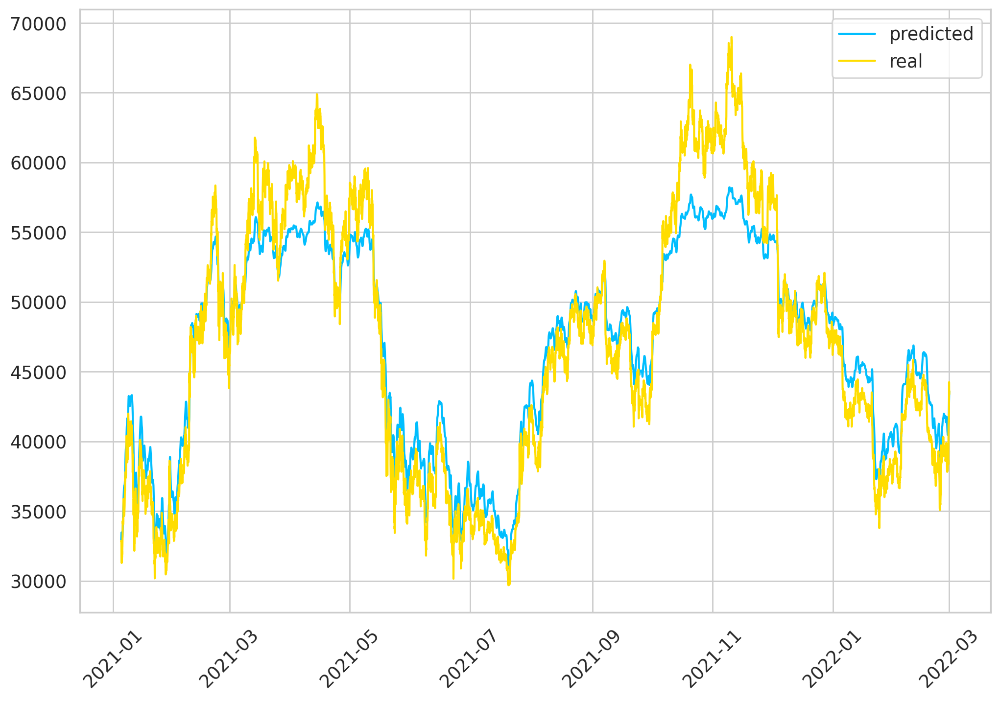

In [37]:
dates = matplotlib.dates.date2num(test_sequence_data.index.tolist())
plt.plot_date(dates, test_predictions_descaled, '-', label="predicted")
plt.plot_date(dates, test_labels_descaled, '-', label="real")
plt.xticks(rotation=45)
plt.legend()

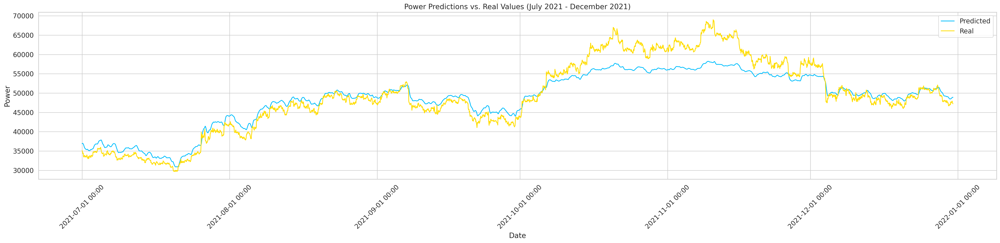

In [38]:
# Filter data for March 2021
start_date = pd.to_datetime('2021-07-01', utc=True)
end_date = pd.to_datetime('2021-12-31', utc=True)
mask = (test_sequence_data.index >= start_date) & (test_sequence_data.index < end_date)

filtered_dates = matplotlib.dates.date2num(test_sequence_data.index[mask].tolist())
filtered_predictions = [pred for i, pred in enumerate(test_predictions_descaled) if mask[i]]
filtered_labels = [label for i, label in enumerate(test_labels_descaled) if mask[i]]

# Plotting
plt.figure(figsize=(28, 7))

plt.plot_date(filtered_dates, filtered_predictions, '-', label="Predicted")
plt.plot_date(filtered_dates, filtered_labels, '-', label="Real")

# Formatting
plt.xlabel('Date')
plt.ylabel('Power')
plt.title('Power Predictions vs. Real Values (July 2021 - December 2021)')
plt.xticks(rotation=45)
plt.legend()

# Date formatting (optional, adjust as needed)
date_format = matplotlib.dates.DateFormatter('%Y-%m-%d %H:%M')
plt.gca().xaxis.set_major_formatter(date_format)

plt.tight_layout()
plt.show()

## Anomaly Detection

In [39]:
train_mae_loss = np.abs(np.array(train_predictions) - np.array(train_labels))
train_mae_loss

array([0.11825347, 0.1196416 , 0.11971486, ..., 0.02922827, 0.03404433,
       0.04024208])

In [40]:
test_mae_loss = np.abs(np.array(test_predictions) - np.array(test_labels))
test_mae_loss

array([0.00391924, 0.01147413, 0.01840305, ..., 0.07071614, 0.00561965,
       0.00155783])

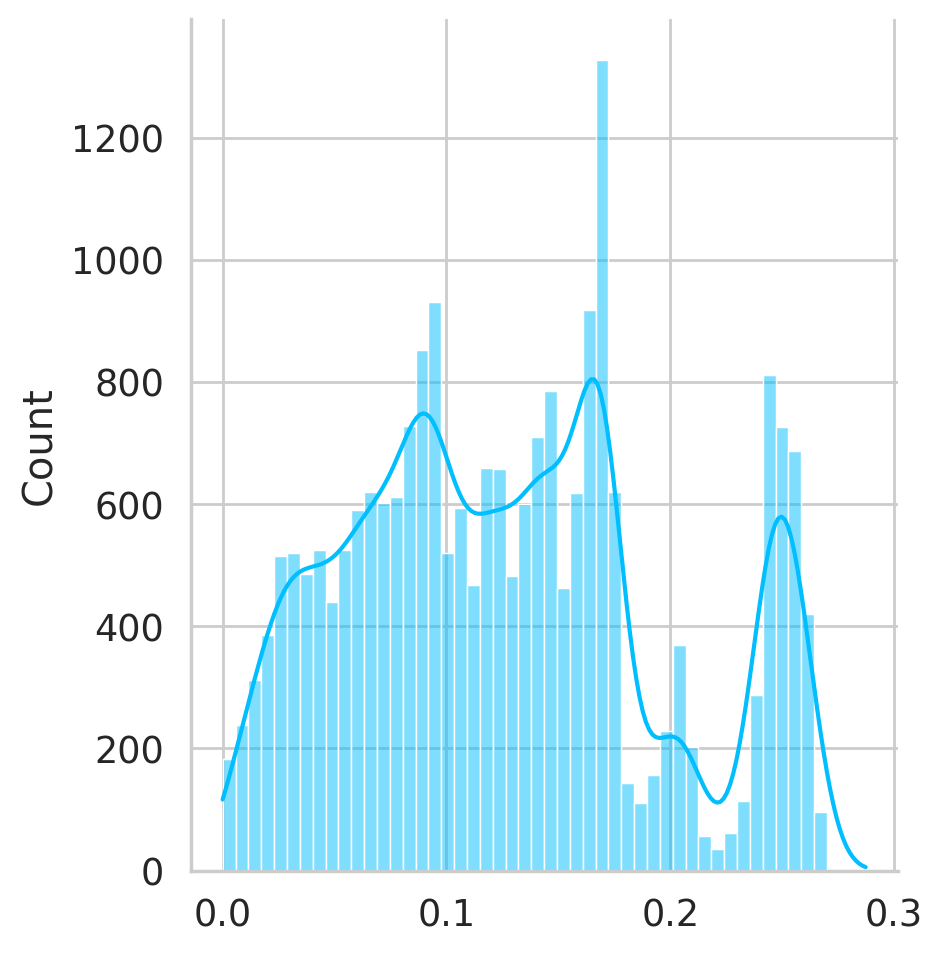

In [41]:
# Plot the distribution of MAE loss
sns.displot(train_mae_loss, bins=50, kde=True)
plt.show()

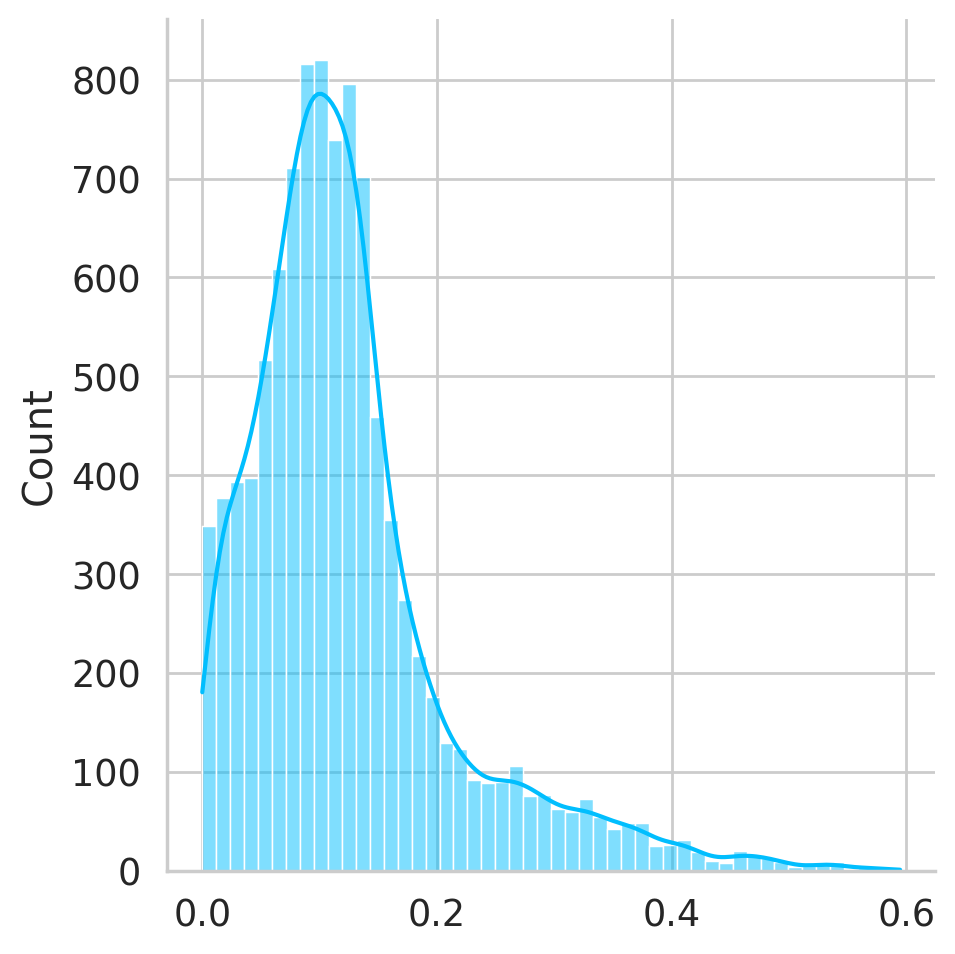

In [42]:
# Plot the distribution of MAE loss
sns.displot(test_mae_loss, bins=50, kde=True)
plt.show()

In [43]:
THRESHOLD = 0.2

test_score_df = pd.DataFrame(index=test_df[SEQUENCE_LENGHT:].index)
test_score_df['loss'] = test_mae_loss
test_score_df["threshold"] = THRESHOLD
test_score_df["anomaly"] = test_score_df.loss > test_score_df.threshold
test_score_df["high"] = test_df[SEQUENCE_LENGHT:].high

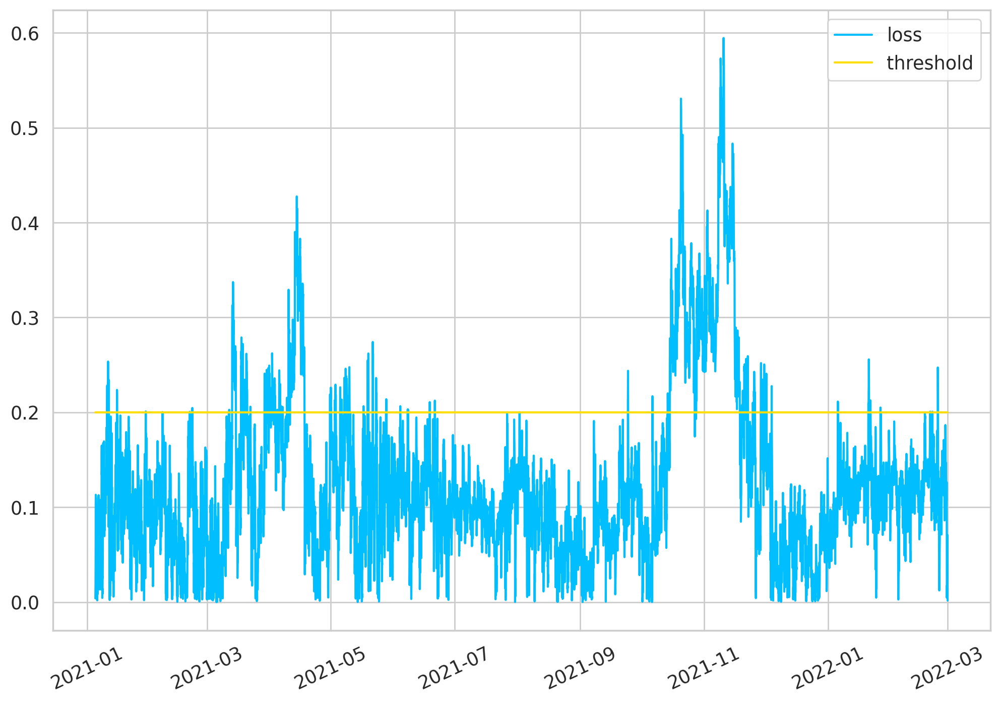

In [44]:
plt.plot(test_score_df.index, test_score_df.loss, label='loss')
plt.plot(test_score_df.index, test_score_df.threshold, label='threshold')
plt.xticks(rotation=25)
plt.legend()
plt.show()

In [45]:
anomalies = test_score_df[test_score_df.anomaly == True]
anomalies

,loss,threshold,anomaly,high
date,,,,
2021-01-10 19:00:00+00:00,0.200847,0.2,True,0.981861
2021-01-10 20:00:00+00:00,0.228313,0.2,True,0.940929
2021-01-11 03:00:00+00:00,0.210727,0.2,True,0.881086
2021-01-11 04:00:00+00:00,0.232008,0.2,True,0.843719
2021-01-11 05:00:00+00:00,0.215346,0.2,True,0.840968
...,...,...,...,...
2022-02-21 12:00:00+00:00,0.200701,0.2,True,0.943125
2022-02-24 03:00:00+00:00,0.221014,0.2,True,0.844557
2022-02-24 04:00:00+00:00,0.247296,0.2,True,0.803763


In [46]:
len(anomalies.index)

1406

In [47]:
anomalies.high.values

array([0.98186121, 0.94092897, 0.88108611, ..., 0.80376293, 0.79875292,
       0.79678742])

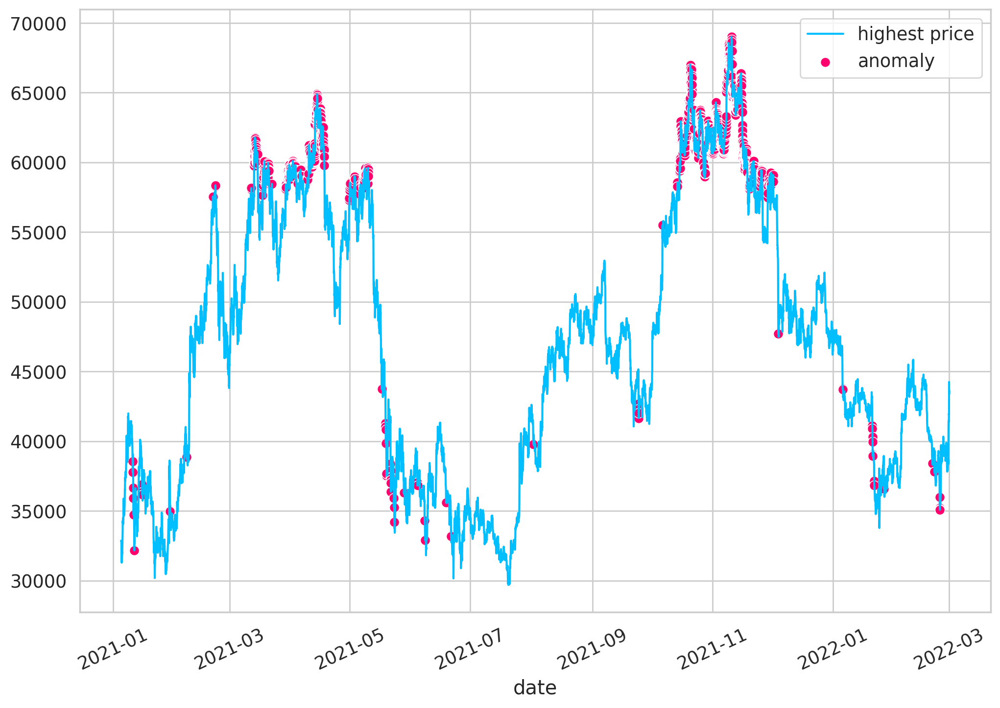

In [48]:
plt.plot(test_df[SEQUENCE_LENGHT:].index,
         test_labels_descaled,
         label='highest price')

sns.scatterplot(x=anomalies.index,
                y=descaler.inverse_transform(anomalies.high.values.reshape(1,-1)).flatten().tolist(),
                color=sns.color_palette()[3],
                s=52,
                label='anomaly')

plt.xticks(rotation=25)
plt.legend()

# Saving Model weights, scaler and descaler

In [49]:
torch.save(trained_model, '/content/drive/MyDrive/Random Colabs/btc_checkpoints2/BTC_Model.pth')

In [50]:
import pickle

# Save the scaler
with open('/content/drive/MyDrive/Random Colabs/btc_checkpoints2/scaler.pkl', 'wb') as f:
    pickle.dump(scaler, f)

# Save the descaler
with open('/content/drive/MyDrive/Random Colabs/btc_checkpoints2/descaler.pkl', 'wb') as f:
    pickle.dump(descaler, f)